# Examen-Tarea 2

# Problema 1

Considerar una partícula constreñida a moverse en un círculo de radio R. La energía del sistema es $E =  \frac{p^2}{2mR^2}$ que corresponde a un movimiento con momento angular con $\dot \theta = \omega=\frac{p}{mR^2}$. El sistema se perturba por una fuerza cada tiempo $\tau$ con la misma intensidad $\epsilon$ en la misma dirección y sentido. Es decir, la componente tangencial de esta fuerza dependerá del punto del írculo en el que esté la partícula.

La fuerza cambia instantáneamente el momento angular. Si al momento de que se aplique la fuerza la partícula se encuentra en $\theta(t)$. en ese instante el cambio de momento es $\Delta p = \epsilon cos \theta$. p permanece constante un tiempo $\tau$, luego sufrirá un cambio de momento $\epsilon cos\theta$ y permanecerá constante hasta que se cumpla una vez más el periodo. $\theta$ tiene la forma $\theta = \theta_0 +\omega t$ modulo 2 $\pi$.

Como la perturbación es periódica podemos tomar un punto en el espacio fase y mapearlo al punto donde estará después de un tiempo $\tau$. Supongamos como condiciones iniciales $\theta_0, p_0$ y fijar el valor de $\tau$


a) Muestra que en el mapeo los valores subsecuentes son 
$$
\theta_{i+1} = \theta_{i}+ \frac{p_{i+1} \tau}{mR^2}
$$
$$
p_{i+1} = p_i + \epsilon cos \theta_i
$$

donde se ha tomado en cuenta que en el momento en el que la fuerza actua $\theta$ tenía un valor $\theta_i$

NOTA: p es el momento angular de la partícula. Se conservará la notación p para coincidir con el enunciado

Llamemos al tiempo en el que $\theta=\theta_i$ $t_i$ y  al tiempo $\theta = \theta_{i+1}$ $t_{i+1}$. La fuerza se aplica cada que pasa un tiempo $\tau$. Sabemos que la fuerza se aplicó en el tiempo $t_i$ y que el momento cambió en ese instante $\Delta p$. Cuando la fuerza no está presente la magnitud de la velocidad de la partícula, y por lo tanto la magnitud de su momento permanecen constantes. Por ello
$$
p_{i+1}=p_i+\Delta p =p_i+ \epsilon cos\theta_i$$

Para tiempos después de $t_i$ el momento de la partícula es $p_{i+1}$. La variable angular en el tiempo $t_{i+1}$ es entonces:
$$
\theta_{i+1}= \theta_i+\omega \Delta t=\theta_i+\frac{p_{i+1}\tau}{mR^2}$$

b) Con $\epsilon =0$ usar 200 condiciones iniciales tales que $p_0$ pertenezca a $[-\pi/2,\pi/2]$ y $\theta$ a $[0,2\pi]$. y encontrar las curvas en el plano ($\theta,p)$ que resultan de muchas iteraciones. Explicar

In [1]:
from pylab import *
from scipy.integrate import *
%matplotlib inline

Hacemos un programa para que cree las condiciones iniciales aleatorias entre los intervalos pedidos.

In [2]:
def condiciones(limite):
    th = 2*pi*rand()
    p = (0.5-rand())*pi
    return array([th,p])
    

Hacemos un programa para el mapeo:

In [3]:
def mapeo(th_p,tau,epsilon):
    p1 = th_p[1]+epsilon*cos(th_p[0])
    th1 = th_p[0]+p1*tau
    return array([th1,p1])

Las ecuaciones de movimiento son muy sencillas, ya que la evolución en el tiempo de $\theta$ y p corresponden respectivamente a una evolución a omega constante y p constante, cuando la perturbación no está prendida, y a una evolución descrita por las expresiones de a) cuando prendemos la perturbación.

Resolvemos ahora la evolución del sistema para 200 condiciones iniciales aleatorias.

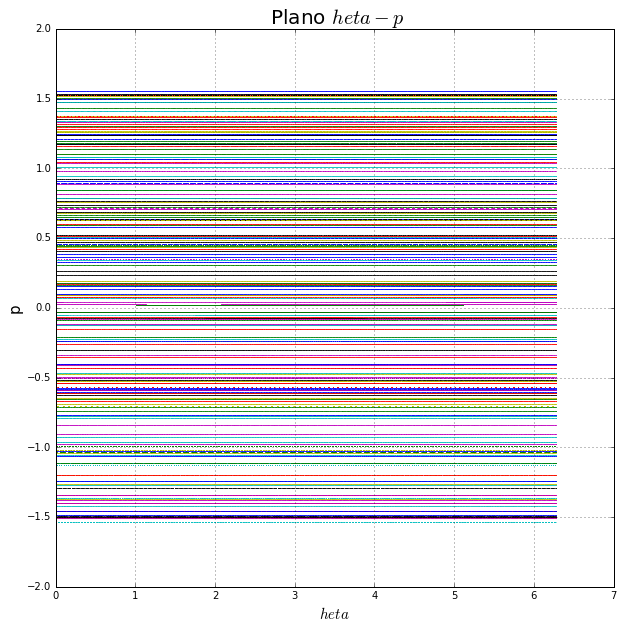

In [4]:
tau = .1
t = arange(0,200,tau)
epsilon = 0

grafica =subplots(figsize=(10, 10))
grid(True)
title(' Plano $\theta-p$',fontsize = 20)
xlabel('$\theta$',fontsize =15), ylabel('p',fontsize =15)
for i in range(200):
    
        pto = condiciones(pi/2)
        #plot(pto[0],pto[1],'o')
        sol = zeros([len(t),2])
        sol[0] = pto
        for j in range(len(t)-1):
            pto_ini = sol[j]
            sol[j+1]= mapeo(sol[j],tau,epsilon)
            if sol[j+1][0]>=(2*pi):
                 sol[j+1][0]=sol[j+1][0]%(2*pi)
            if sol[j+1][0]<0:
                sol[j+1][0] = 2*pi+sol[j+1][0] 
        theta1 = [row[0] for row in sol]
        p1 = [row[1] for row in sol]
        plot(theta1,p1,'.',markersize = 0.5)
show()

El resultado para todas las condiciones iniciales son rectas, como cabría esperar si hacemos $\epsilon =0$ en el mapeo de a) (no  hay cambios en la velocidad angular ni en el momento).

c) ¿El sistema tiene puntos fijos para $\epsilon$ diferente de cero? Si esto es así encontrarlos y explicar qué significan estos puntos.

  Si $\epsilon$ no es cero la condición para que $\theta_i =\theta_{i +1}$ 


1) $p_{i+1} = 0 \implies p_i = -\epsilon cos \theta_i$

pero para que $(\theta_i,p_i)$ sea un punto fijo necesitamos además que  $p_{i+1} = p_i$, por lo que los puntos fijos serán $p_i = 0$ y $\theta_i$ que resuelva  $cos \theta_i = 0$, es decir, $\theta_i = \pi/2,3\pi/2$

Por ello tendremos 2 puntos fijos. A continuación graficamos el espacio $\theta-p$ para condiciones ubicadas en los puntos fijos y para $\epsilon = 0.1$

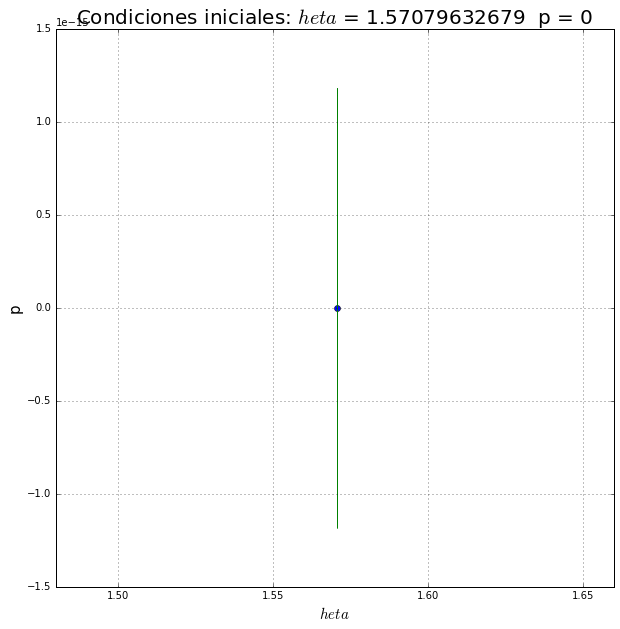

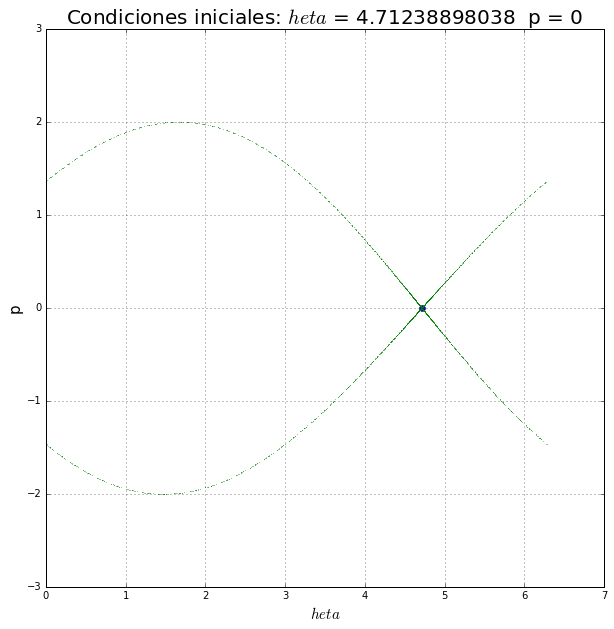

In [5]:
t_ini= array([pi/2,4.71238898038469])  # angulos iniciales
tau = .1
t = arange(0,1000,.1)
epsilon= .1
for i in range(len(t_ini)):
        grafica =subplots(figsize=(10, 10))
        grid(True)
        title('Condiciones iniciales: $\theta$ = %s  p = 0'%t_ini[i],fontsize = 20)
        xlabel('$\theta$',fontsize =15), ylabel('p',fontsize =15)
        
        pto = [t_ini[i],0]
        plot(pto[0],pto[1],'o')
        sol = zeros([len(t),2])
        sol[0] = pto
        for j in range(len(t)-1):
            sol[j+1]= mapeo(sol[j],tau,epsilon)
            if sol[j+1][0]>=(2*pi):
                 sol[j+1][0]=sol[j+1][0]%(2*pi)
            if sol[j+1][0]<0:
                sol[j+1][0] = 2*pi+sol[j+1][0] 
        theta = [row[0] for row in sol]
        p = [row[1] for row in sol]
        plot(theta,p,'.',markersize = 0.5)
show()

Observamos que la variación en $\theta$ y p para $\theta_0 =\pi/2$ es menor a $10^{-14}$, por lo que se puede concluir que la primera simulación muestra el comportamiento de un punto fijo. 

Esto quiere decir que si el sistema inicial se encuentra originalmente en un punto fijo y hacemos evolucionar al sistema con la perturbación la partícula quedará estática y con momento siempre igual a cero. Intuitivamente esto es claro ya que si la fuerza perturbativa tiene siempre la misma dirección habrá un ángulo para el cuál la partícula estará sólo sujeta a una fuerza radial. Ya que la partícula está constreñida a moverse en un círculo la fuerza en estos puntos no afectará el movimiento de la partícula. Si se le da un momento inicial nulo a la partícula esta nunca abandonará el punto fijo.  

d)Realizar simulaciones para $\epsilon = 0.01,0.05,0.1,0.2,0.3,0.4,0.7$ y 1.1. Explicar los resultados

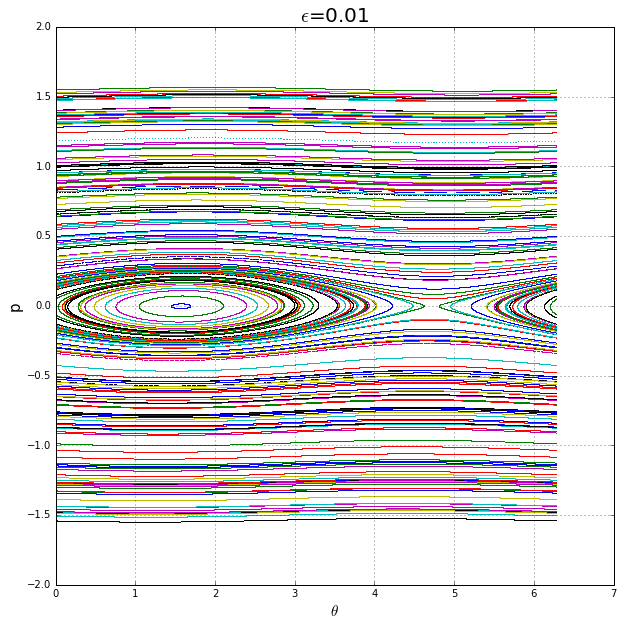

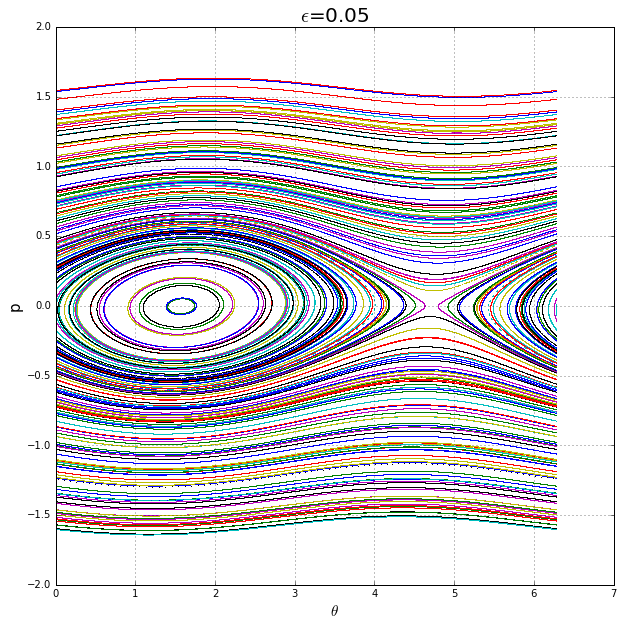

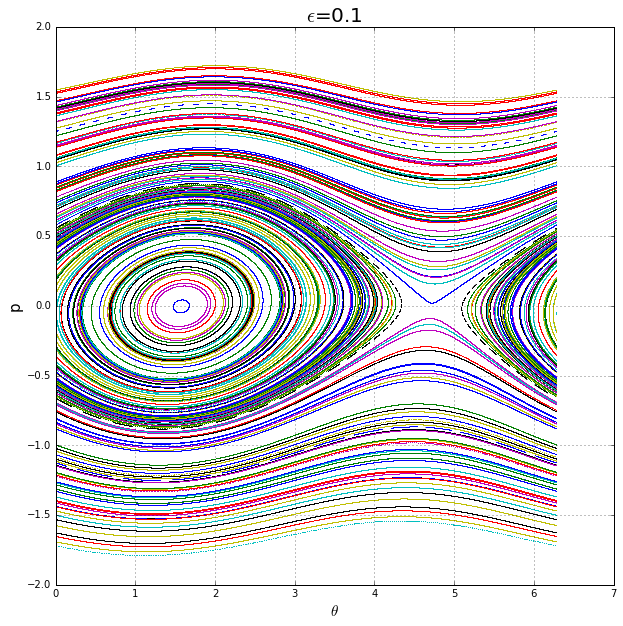

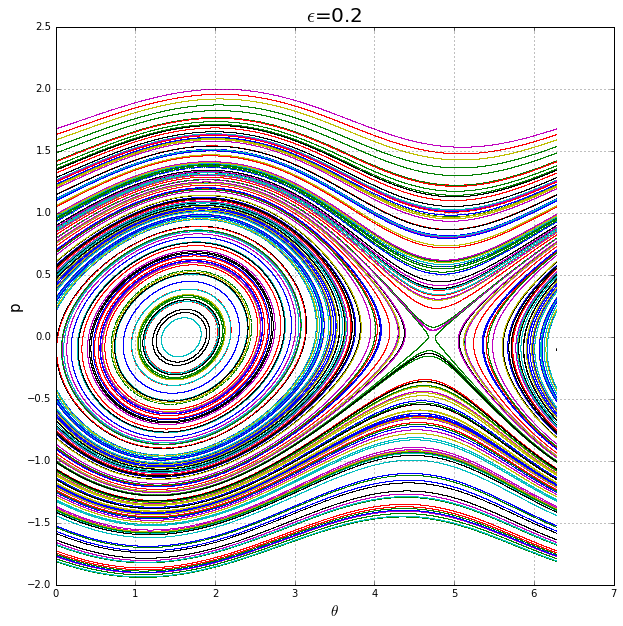

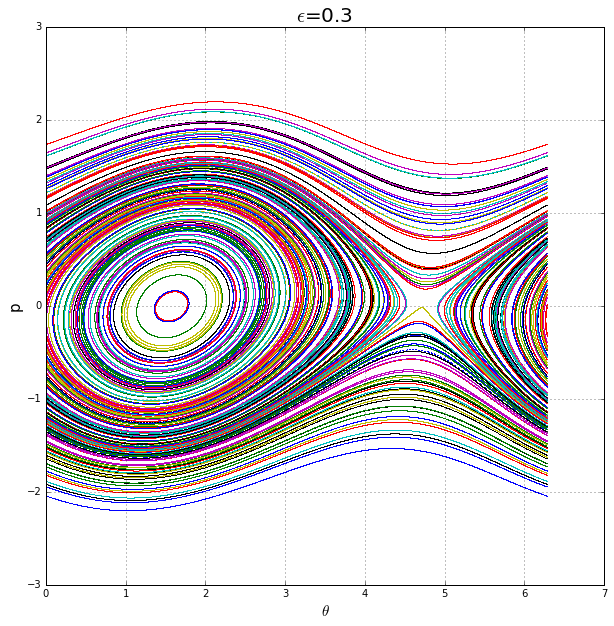

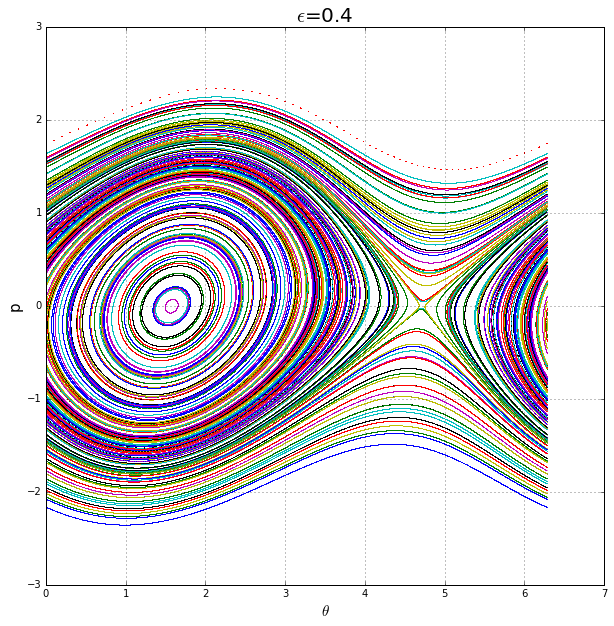

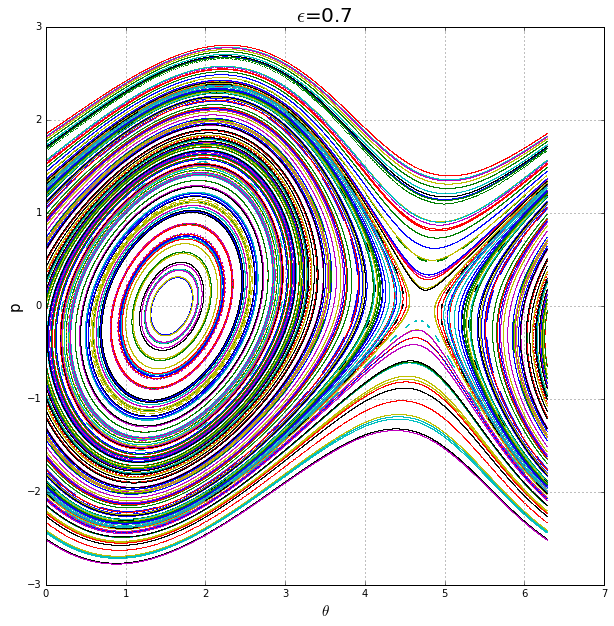

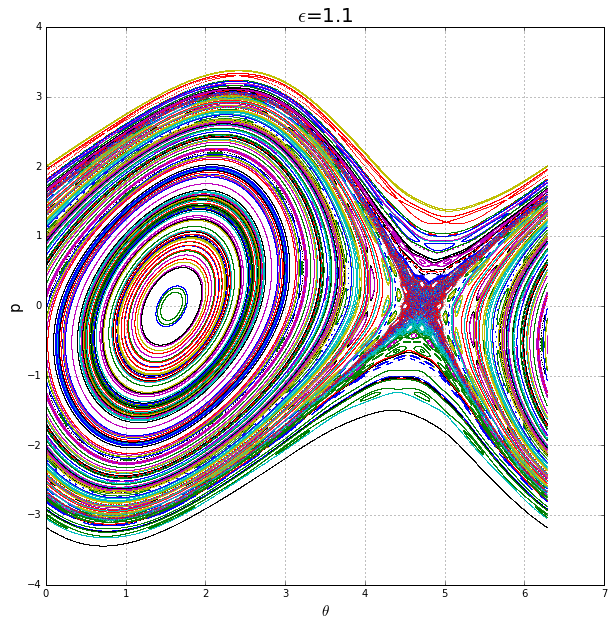

In [6]:
epsilon = array([0.01,0.05,0.1,0.2,0.3,0.4,0.7, 1.1])
tau = .5
sol2=[]
for i in range(len(epsilon)):
        grafica =subplots(figsize=(10, 10))
        grid(True)
        title('$\epsilon$=%s'%epsilon[i],fontsize = 20)
        xlabel(r'$\theta$',fontsize =15), ylabel('p',fontsize =15)
        for j in range(200):
            pto = condiciones(pi/2)
            #plot(pto[0],pto[1],'o')
            sol = zeros([len(t),2])
            sol[0] = pto
            for n in range(len(t)-1):
                sol[n+1]= mapeo(sol[n],tau,epsilon[i])
                if sol[n+1][0]>=(2*pi):
                     sol[n+1][0]=sol[n+1][0]%(2*pi)
                if sol[n+1][0]<0:
                    sol[n+1][0] = 2*pi+sol[n+1][0] 
            theta = [row[0] for row in sol]
            p = [row[1] for row in sol]
            plot(theta,p,'.',markersize = 0.5)
        sol2.append(sol)  # se guarda la última solución en un arreglo para realizar la animación más tarde
show()

Conforme aumentamos la magnitud de la perturbación el espacio fase de la partícula difiere más y más de lo que habíamos obtenido para $\epsilon = 0$. Notamos que el espacio fase se parece mucho al de un péndulo: esto resulta lógico ya que la situación que se está considerando se asemeja mucho a la de un péndulo: tenemos una fuerza que está siempre dirigida a una misma dirección (en caso de un péndulo esta sería la gravedad) y una partícula constreñida a moverse en un círculo (como un péndulo si pensamos que aquello que une al péndulo con su punto de apoyo es algo rígido). Mientras hagamos la perturbación más intermitente (aumentando $\tau$, disminuiremos esta similitud. Mostramos esa última afirmación haciendo $\tau = 1$

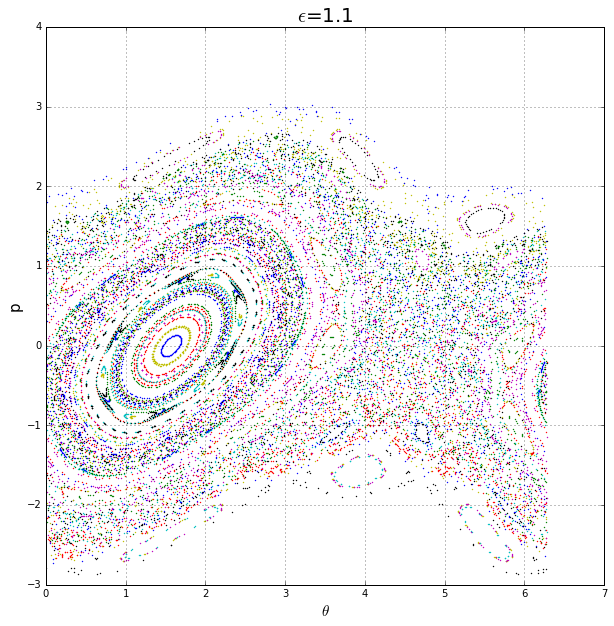

In [7]:
epsilon = array([0.01,0.05,0.1,0.2,0.3,0.4,0.7, 1.1])
tau = 1
t = arange(0,400,4)
grafica =subplots(figsize=(10, 10))
grid(True)
title('$\epsilon$=%s'%epsilon[-1],fontsize = 20)
xlabel(r'$\theta$',fontsize =15), ylabel('p',fontsize =15)
for j in range(200):
    pto = condiciones(pi/2)
    #plot(pto[0],pto[1],'o')
    sol = zeros([len(t),2])
    sol[0] = pto
    for n in range(len(t)-1):
        sol[n+1]= mapeo(sol[n],tau,epsilon[-1])
        if sol[n+1][0]>=(2*pi):
                sol[n+1][0]=sol[n+1][0]%(2*pi)
        if sol[n+1][0]<0:
            sol[n+1][0] = 2*pi+sol[n+1][0] 
    theta = [row[0] for row in sol]
    p = [row[1] for row in sol]
    plot(theta,p,'.',markersize = 1.8)
show()

 En el último espacio fase se observan trayectorias cerradas en algunas zonas del espacio fase que no corresponden al péndulo.

# Problema 2

Considere u sistema cuyo hamiltoniano es
$$
H = \frac{1}{2}(p_x^2+p_y^2)+\frac{1}{2}(x^2+y^2)+x^2y-\frac{1}{3}y^3
$$

a) Mostrar que el sistema tiene órbitas acotadas

H = T+V, por lo que identificamos al potencial como $V(x,y) =\frac{1}{2}(x^2+y^2)+x^2y-\frac{1}{3}y^3$. Graficamos ahora el potencial para cortes de x y  de y

In [8]:
def V(x,y):
    V = 0.5*(x**2+y**2)+x**2*y-1/3*y**3
    return V

Para y = 0

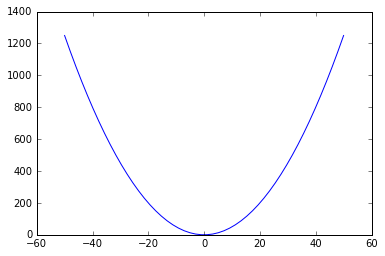

In [9]:
x = linspace(-50,50)
plot(x,V(x,0))

Para x = 0

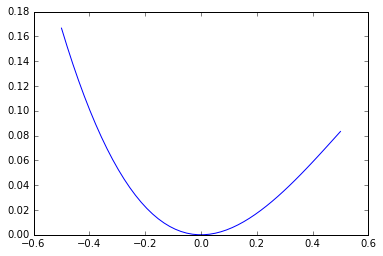

In [10]:
x = linspace(-.5,.5)
plot(x,V(0,x))

Observamos que en los dos cortes hay un pozo de potencial. Esto significa que si la partícula tiene una energía inicial menor a , los valores de x y y serán acotados, es decir, tendremos una órbita acotada.

b) Realizar programa que escoja condiciones iniciales con x = 0 y con valores de $(y,p_y)$ compatibles con la condición de energía $E<16$

Si x = 0 la energía inicial será 
$$
H = \frac{1}{2}(p_x^2+p_y^2)+\frac{1}{2}(y^2)-\frac{1}{3}y^3
$$

Ahora hacemos un programa que encuentre valores para y y el momento en y que sean compatibles con la condición para la energía. ( es decir que sus contribuciones a la energía no sean mayores a la cota que se ha impuesto a la energía).

In [11]:
def energia(x_p):
    E = .5*(x_p[2]**2+x_p[3]**2+x_p[1]**2+x_p[0]**2)-1/3*x_p[1]**3+x_p[0]**2*x_p[1]
    return E

In [12]:
def cond_ini(En=16):
    x,E = 0,3001
    while E>En:
        y = 50*(rand()-1)
        py =  50*(rand()-1)
        E =energia([0,y,0,py])
    return y,py  

Escogemos $E_i =2$. A partir de esto fijamos nuestras condiciones iniciales como:

Ahora obtenga la trayectoria para la condición inicial que se escoja y resuelva las ecuaciones de movimiento dadas por:
$$
\dot x = \frac{\partial H}{\partial p_x}= p_x
$$
$$
\dot y = \frac{\partial H}{\partial p_y}= p_y
$$
$$
\dot{p_x} =- \frac{\partial H}{\partial x} = -x-2xy
$$
$$
\dot{p_y} =- \frac{\partial H}{\partial y} =-y -x^2+y^2
$$

Programamos las ecuaciones:

In [13]:
def ecuacion(x_p,t):
    dx = x_p[2]
    dy = x_p[3]
    dpx = -x_p[0]-2*x_p[0]*x_p[1]
    dpy = -x_p[1]-x_p[0]**2+x_p[1]**2
    return array([dx,dy,dpx,dpy])

Resolvemos ahora el sistema:

Condiciones iniciales elegidas: [ 0.         -0.17425754  0.33862807 -0.22679881]
Energía inicial: 0.1


((-0.5, 0.5), (-0.5, 0.5))

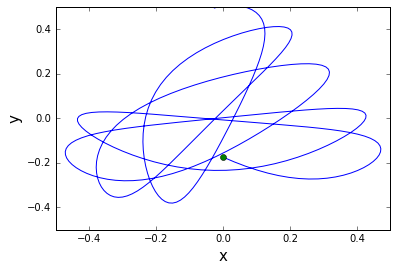

In [14]:
x = 0
E = .1
y,py =cond_ini(E)
cont_energia = energia([0,y,0,py])
px =sqrt(2*(E -cont_energia))
condiciones = array([x,y,px,py])
print("Condiciones iniciales elegidas:", condiciones)
print("Energía inicial:", energia(condiciones))

zoom=.5
t =arange(0,30,.1)
pto_ini = condiciones
sol = odeint(ecuacion,pto_ini,t,atol=1e-19,rtol=1e-9)
xlabel('x',fontsize =15), ylabel('y',fontsize =15)
plot(sol[:,0],sol[:,1])
plot(pto_ini[0],pto_ini[1],'o')
xlim([-zoom, zoom]),ylim([-zoom, zoom])


c)Programar ahora una función que obtenga todos los puntos de la trayectoria solución cuando x = 0.

In [15]:
def root_trayec(func,pto_i,ti,error=1e-5):
    while abs(pto_i[0])>error:
        tip1 = ti - (pto_i[0]/pto_i[2])
        paso = odeint(func,pto_i,[ti,tip1])
        ti,pto_i = tip1,paso[-1]
    return ti,pto_i

Comprobamos que el programa funcione usando la trayectoria obtenida en el inciso anterior

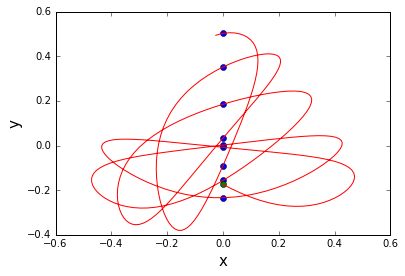

In [16]:
num = len(t)
raices = zeros(num)
puntos = zeros((num,4))
j=0
for i in range(len(t)-1):
    if (sol[i][0]*sol[i+1][0]) < 0:
        raices[j],puntos[j] = root_trayec(ecuacion,sol[i],t[i])
        j+=1
raices,puntos = raices[0:j],puntos[0:j]
xlabel('x',fontsize =15), ylabel('y',fontsize =15)
plot(puntos[:,0],puntos[:,1],'o')
plot(pto_ini[0],pto_ini[1],'o')
plot(sol[:,0],sol[:,1])
show()

c ) Escogemos ahora 15 trayectorias tales que x = 0 $0<y<0.1$,  $-0.15<p_x<0.15$  y $p_y$ compatible con las condiciones anteriores

Modificamos el programa de condiciones iniciales de los incisos anteriores de manera que guarde todas las condiciones iniciales en un arreglo llamado ci

In [17]:
def cond_inii(n,En=16):   #En es la energía inicial que queramos para nuestras trayectorias
    x= 0
    ci =zeros([n,4])
    for i in range(n):
        y = 0.1*(rand())
        px =  0.15*(rand()-1)
        cont_energia = energia([0,y,px,0])
        py =sqrt(2*(En -cont_energia))
        ci[i]=array([0,y,px,py])
    return ci

d) Usando las condiciones iniciales anteriores , realizar las simulaciones con valores de la energía 0.01,0.03,0.1.0.12,0.15,0.166

Guardamos las enegías del enunciado en el arreglo E y posteriormente realizamos las simulaciones. Mostramos el espacio x-y  (si al correr marca error correr más de una vez. A veces no muestra ni las gráficas y da error antes)

/home/est5/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:8: RuntimeWarning: invalid value encountered in sqrt


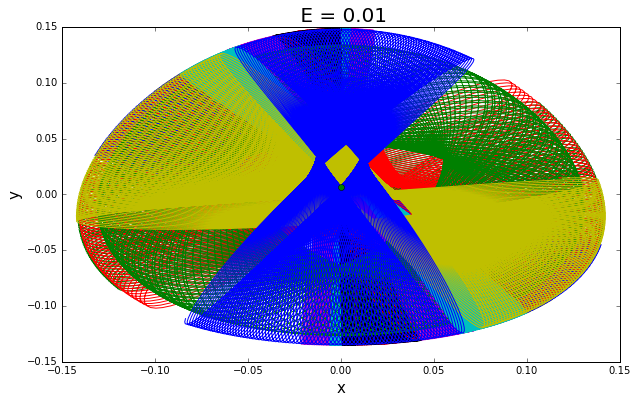

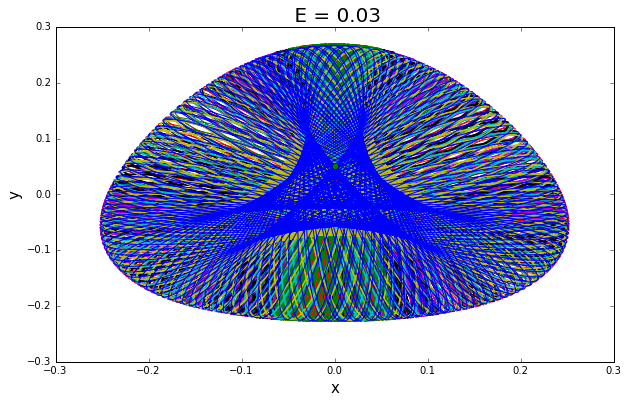

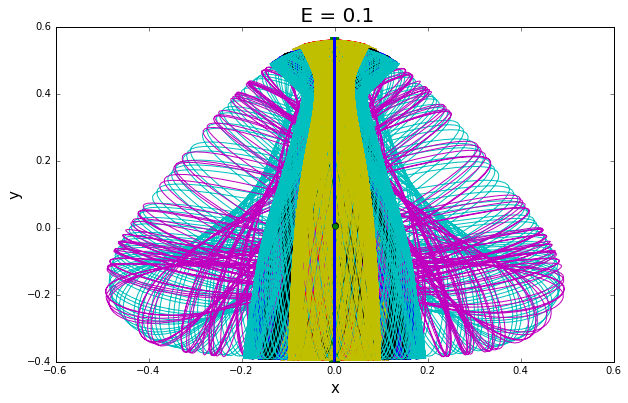

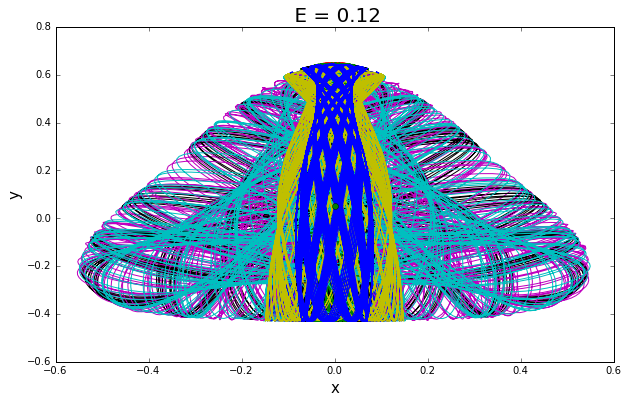

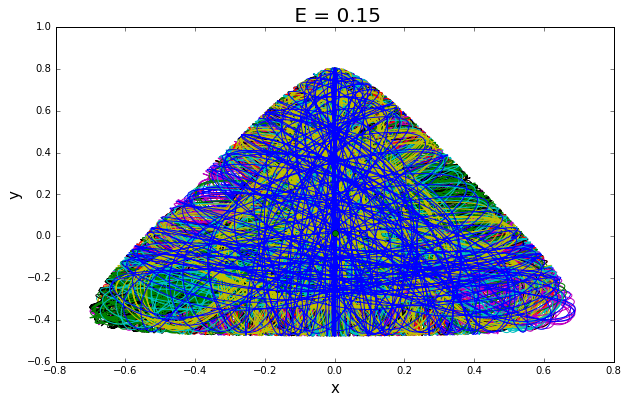

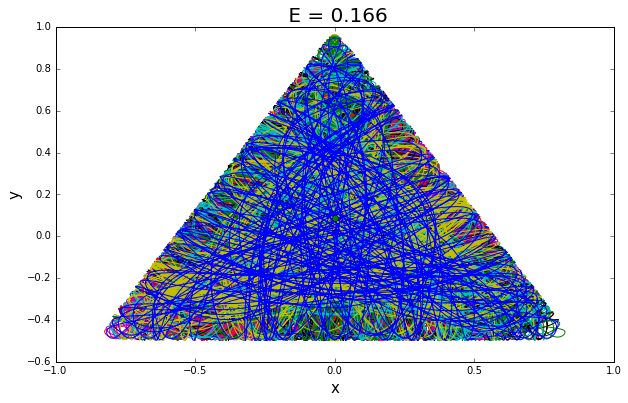

In [18]:
E = array([0.01,0.03,0.1,0.12,0.15,0.166])
t =arange(0,550,.1)
zoom=array([.2,0.3,0.3,0.5,.5,.5])
num_tray = 15
sol = []  #Sol será un arreglo cuyas entrada i-esima sea un  arreglo que contiene la solución para cada una de 
for i in range(len(E)): #las condiciones iniciales que se han dado para la i-ésima energía
    grafica =subplots(figsize=(10, 6))
    solu =[]
    pto_ini = []
    for j in range(num_tray):
        pto_ini = cond_inii(num_tray,E[i])[j]
        soluc = odeint(ecuacion,pto_ini,t,atol=1e-19,rtol=1e-9)
        plot(soluc[:,0],soluc[:,1])
        plot(pto_ini[0],pto_ini[1],'o')
        title(' E = %s'%E[i],fontsize = 20)
        xlabel('x',fontsize =15), ylabel('y',fontsize =15)
        solu.append(soluc)
    sol.append(solu)
    show()
    

Hacer la gráfica del espacio fase y para cada condición inicial

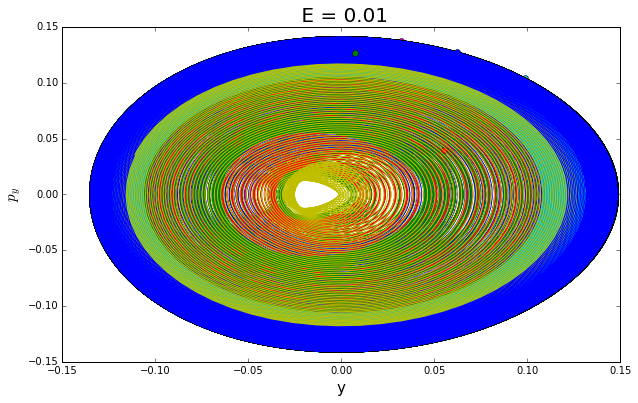

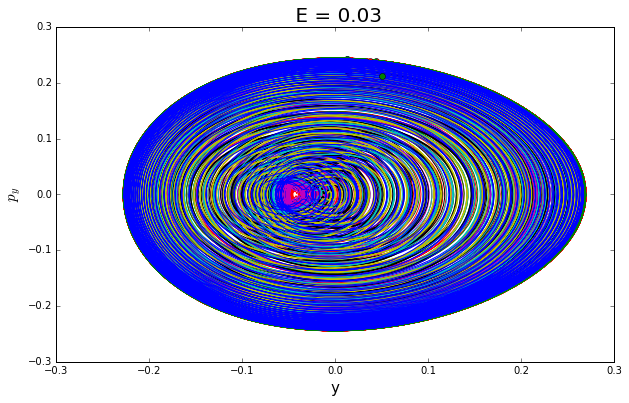

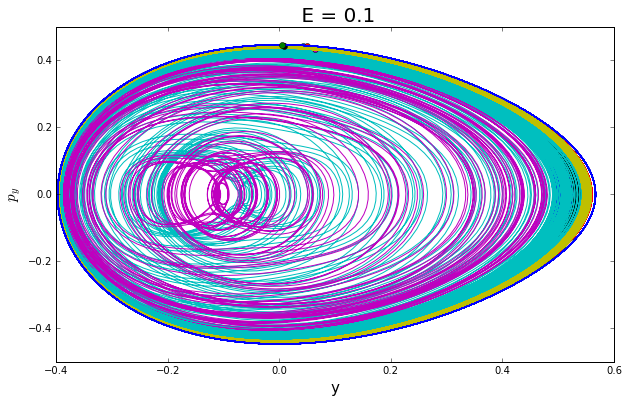

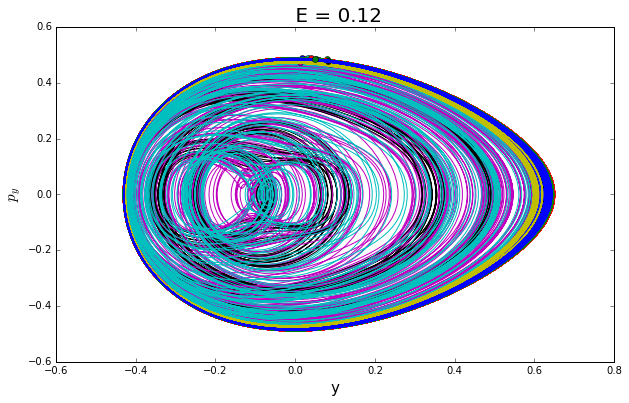

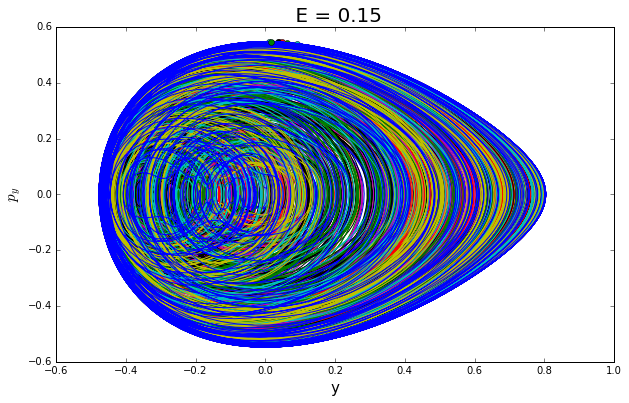

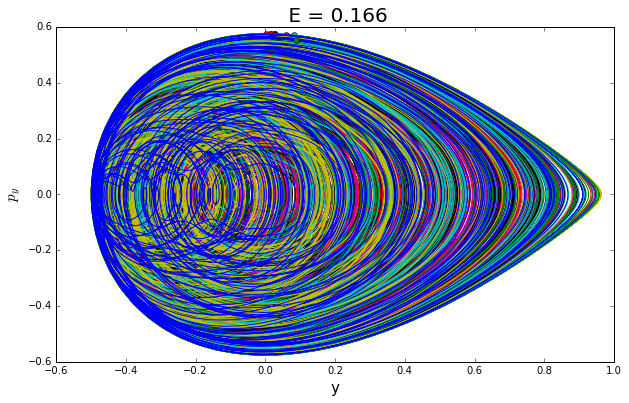

In [19]:
for i in range(len(E)):
    grafica =subplots(figsize=(10, 6))
    for j in range(num_tray):
        plot(sol[i][j][:,1],sol[i][j][:,3])
        title(' E = %s'%E[i],fontsize = 20)
        xlabel('y',fontsize =15), ylabel('$p_y$',fontsize =15)
        plot(sol[i][j][0,1],sol[i][j][0,3],'o')
    show()

Ahora graficamos los puntos que pasan por x = 0 para cada energía dada.

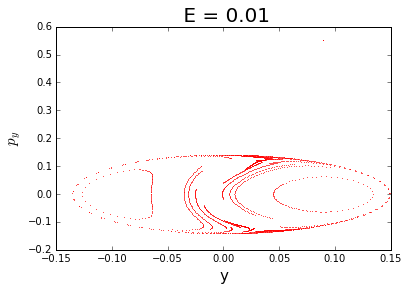

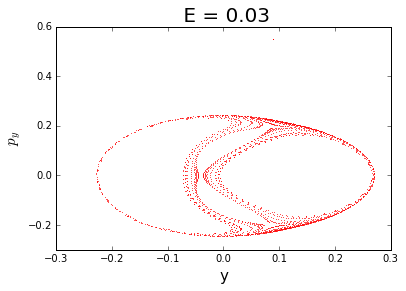

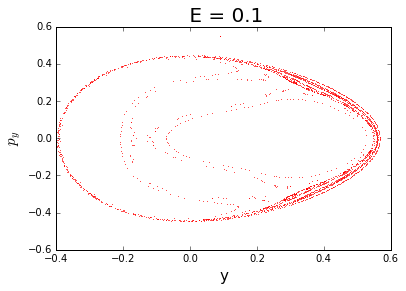

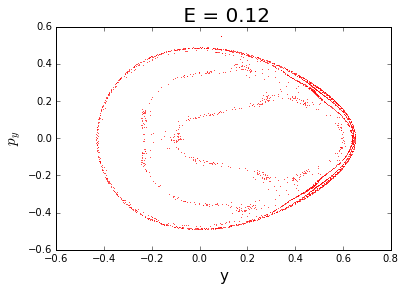

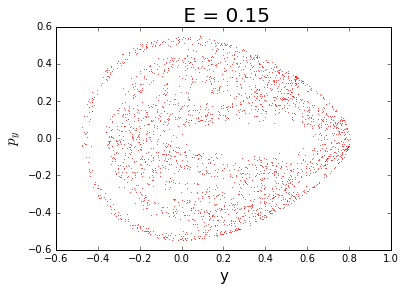

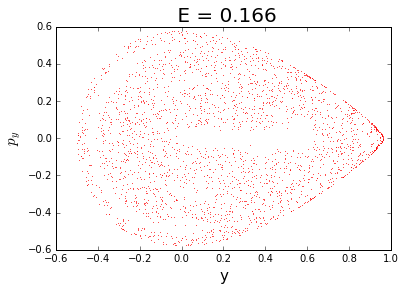

In [20]:
for j in range(len(E)):
    for n in range(num_tray):
        
        num = len(t)
        raices = zeros(num)
        puntos = zeros((num,4))
        m=0
        for i in range(len(t)-1):
            if (sol[j][n][i][0]*sol[j][n][i+1][0]) < 0:
                raices[m],puntos[m] = root_trayec(ecuacion,sol[j][n][i],t[i])
                m+=1
        raices,puntos = raices[0:m],puntos[0:m]
        plot(puntos[:,1],puntos[:,3],'.',color = 'r' ,markersize = 0.8)
        plot(pto_ini[1],pto_ini[3],'.',color = 'r',markersize = 0.8)
        xlabel('y',fontsize =15), ylabel('$p_y$',fontsize =15)
        title(' E = %s'%E[j],fontsize = 20)
        
    show()
    

# Punto extra

Punto extra: Realice un video tipo time-lapse que muestre la evolución de los mapeos para cada uno de
los problemas del examen. Puede agregar mapeos intermedios para mejorar la visualización del video.


Problema 1:
b) Se hará el video para  una condición inicial de las usadas cuando resolvimos el problema arribla. La simulación está ya guardada en p1 y theta1

In [21]:
from JSAnimation import IPython_display
from matplotlib import animation

El video que se muestra es del espacio $\theta-p$


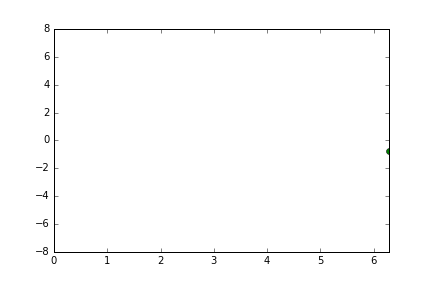
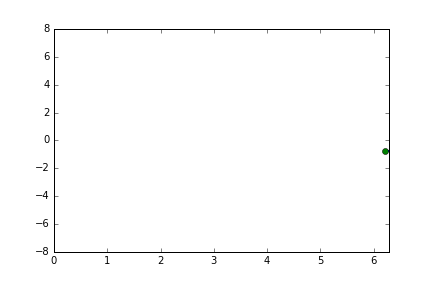
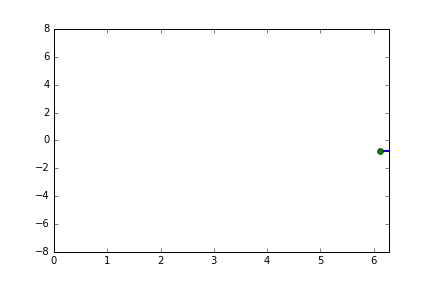
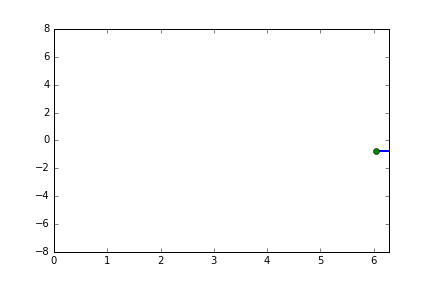
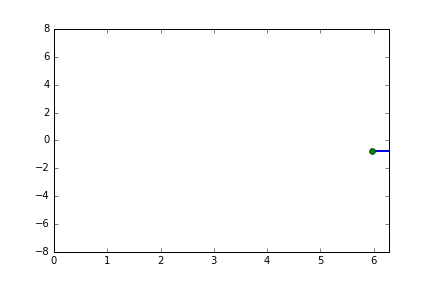
...
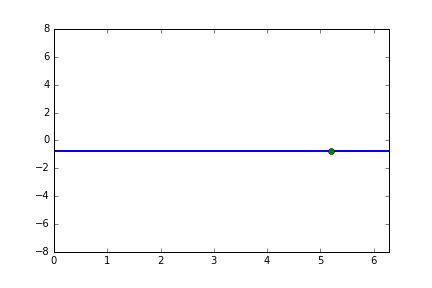
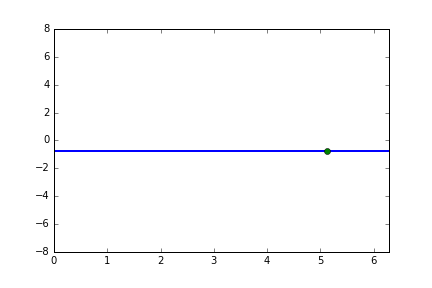
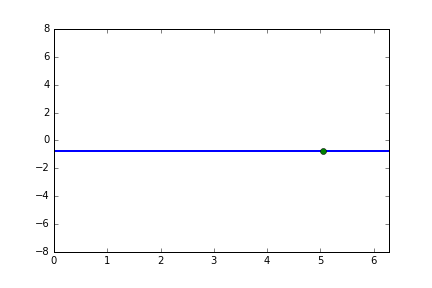
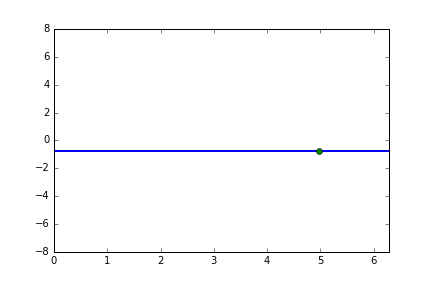
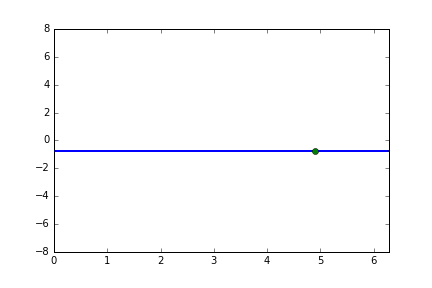

In [22]:


figura = figure() #Crea la figura
ejes = axes(xlim=(0,2*pi),ylim=(-8,8))

trayectoria, = ejes.plot([],[],lw=2)
punto, = ejes.plot([],[],'o')
def init():
    trayectoria.set_data([],[])
    punto.set_data([],[])
    return  trayectoria, punto,  #Inicializa variables

def el_movimiento(i):
    theta,p = theta1,p1
    punto.set_data(theta[i],p[i])
    trayectoria.set_data(theta[:i+1],p[:i+1])
    return trayectoria,punto
    
animation.FuncAnimation(figura,el_movimiento, init_func = init , frames =100,interval=10)

c) Se realiza ahora una serie de simulaciones para cuando $\epsilon$ es diferente a cero. Se realiza una simulación para cada valor de $epsilon$ que se tomó en cuenta para resolver esta parte del examen. Se toma la misma condición inicial para cada punto

In [23]:
epsilon = array([0.01,0.05,0.1,0.2,0.3,0.4,0.7, 1.1])
tau = .1
sol2=[]
for i in range(len(epsilon)):
        pto = [2.61064137757,0.226617682175]
        sol = zeros([len(t),2])
        sol[0] = pto
        for j in range(len(t)-1):
                sol[j+1]= mapeo(sol[j],tau,epsilon[i])
                if sol[j+1][0]>=(2*pi):
                     sol[j+1][0]=sol[j+1][0]%(2*pi)
                if sol[j+1][0]<0:
                    sol[j+1][0] = 2*pi+sol[j+1][0] 
        theta = [row[0] for row in sol]
        p = [row[1] for row in sol]
        sol2.append(sol)  # se guarda la solución en un arreglo para realizar la animación más tarde
show()


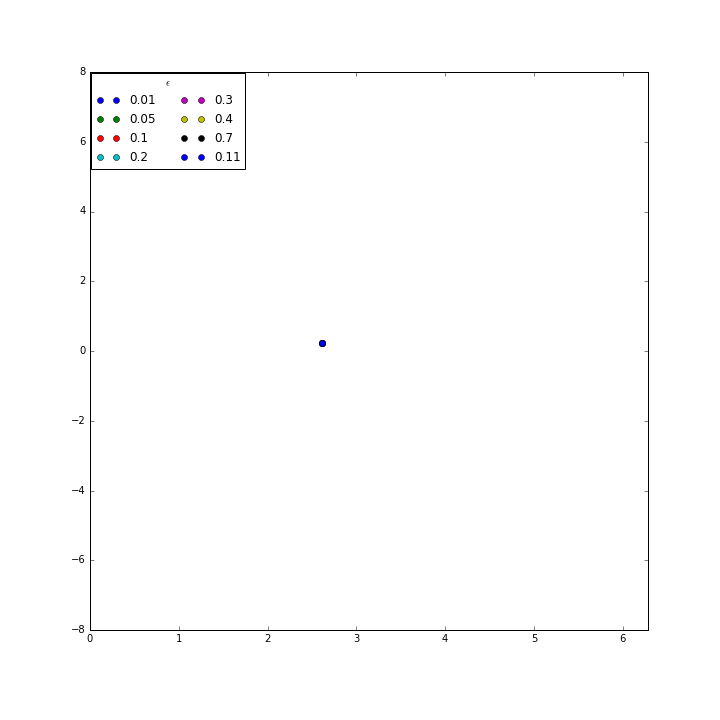
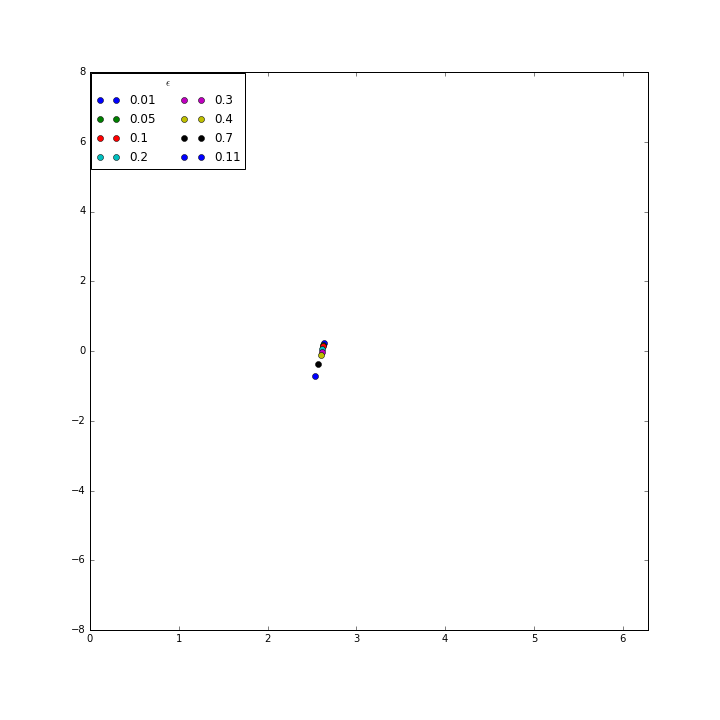
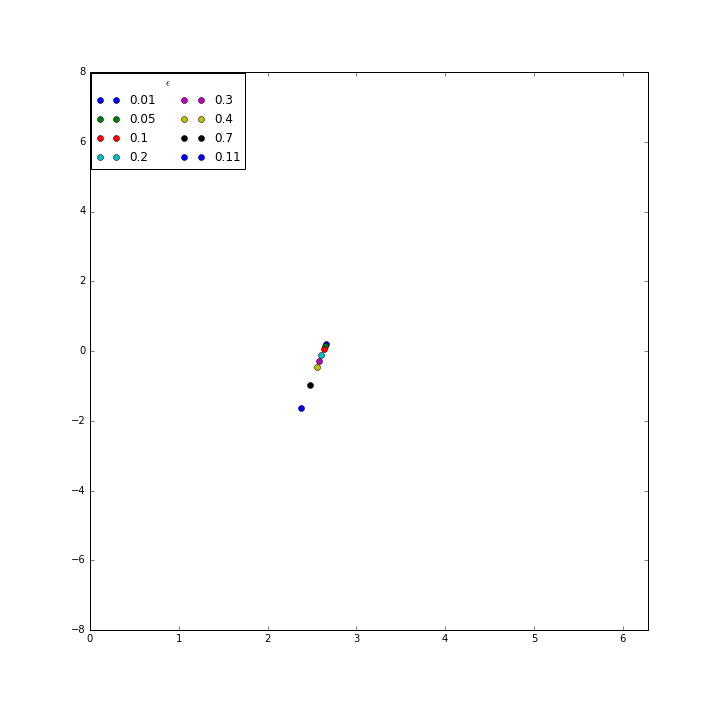
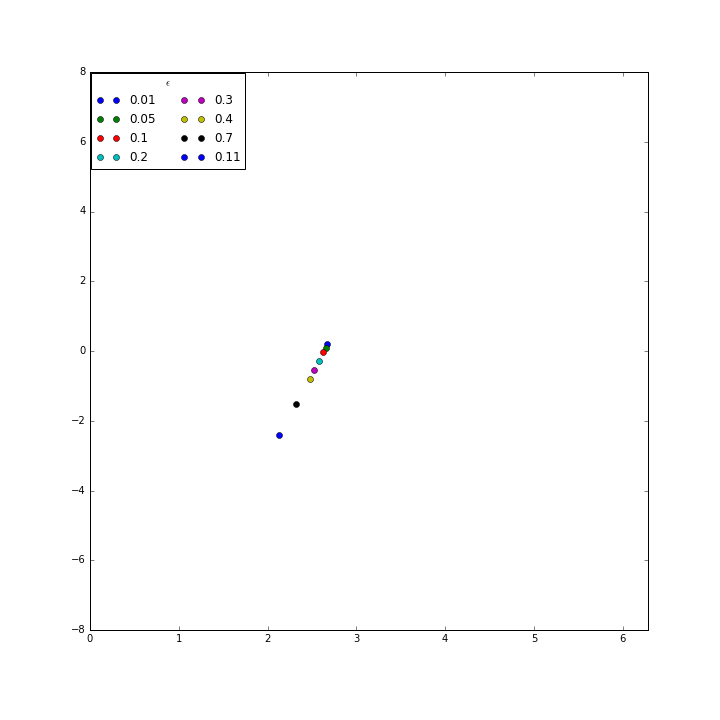
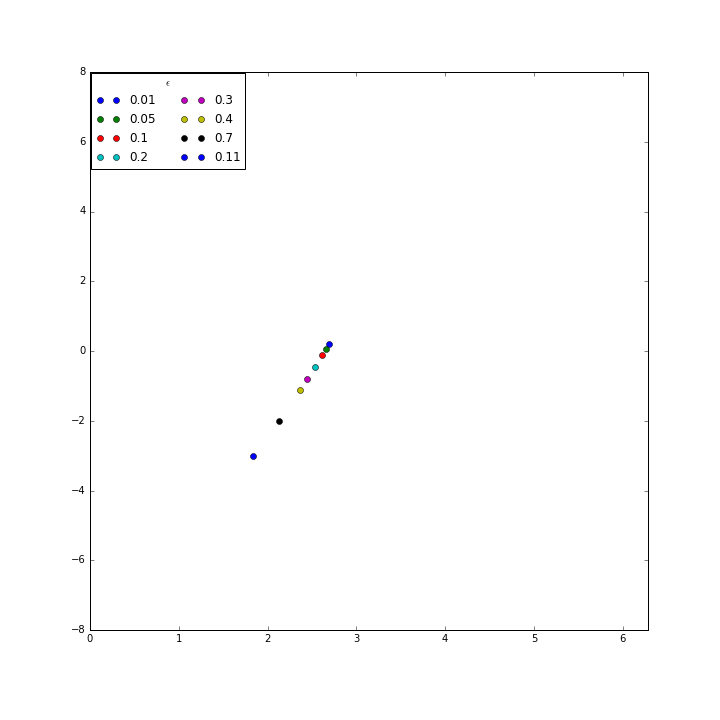
...
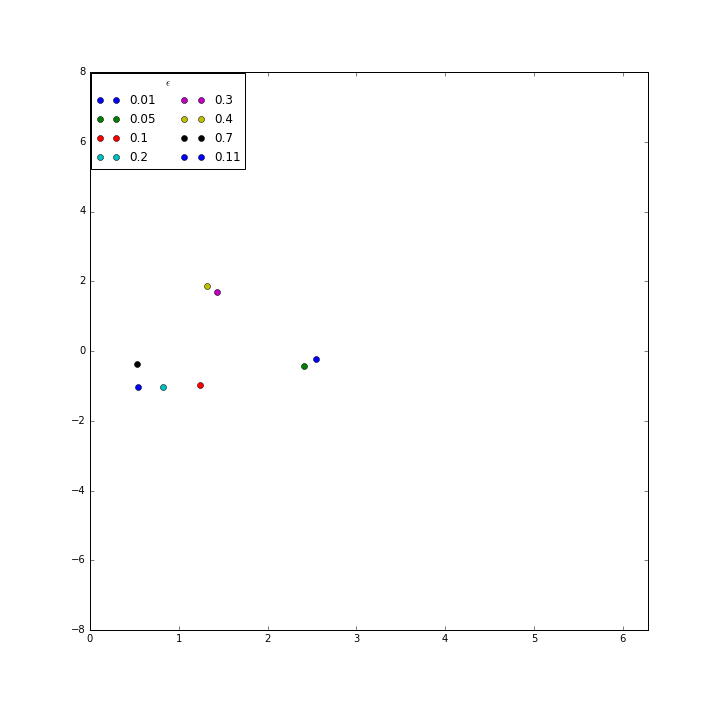
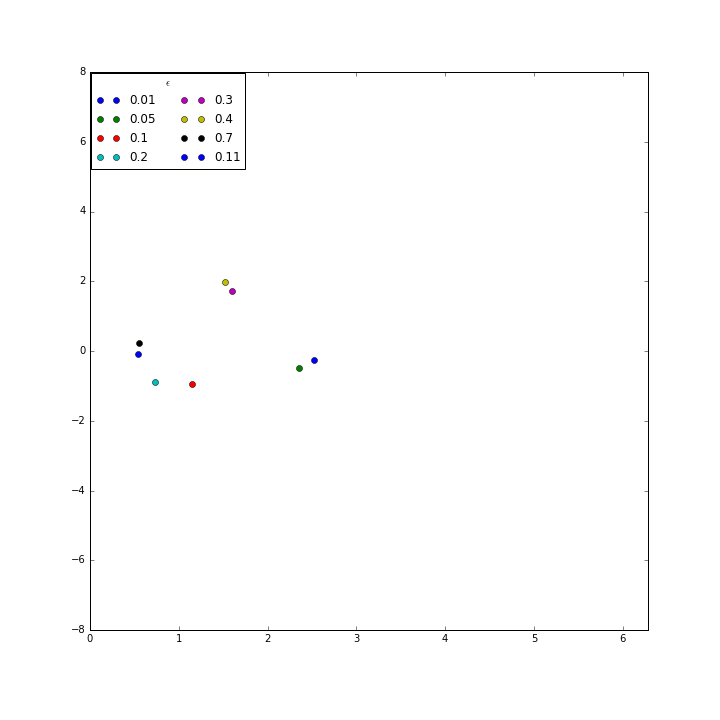
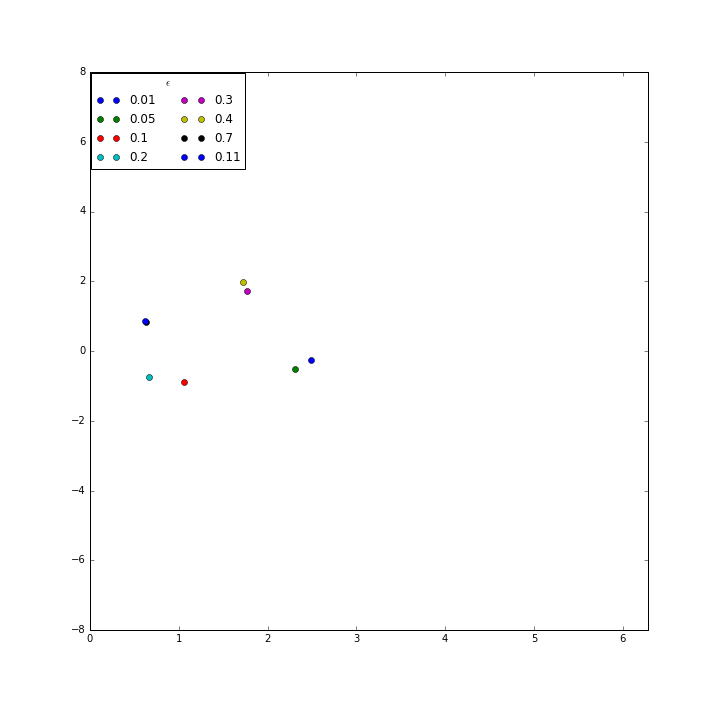
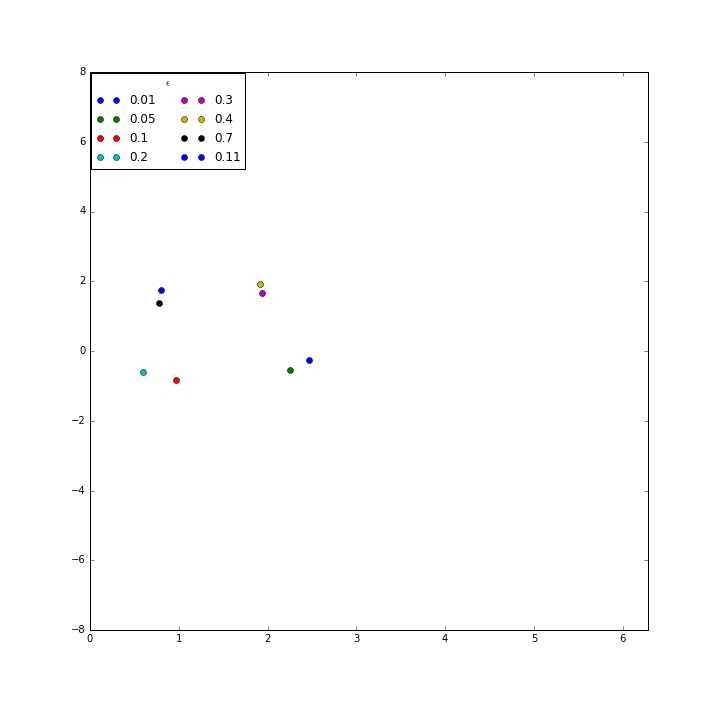
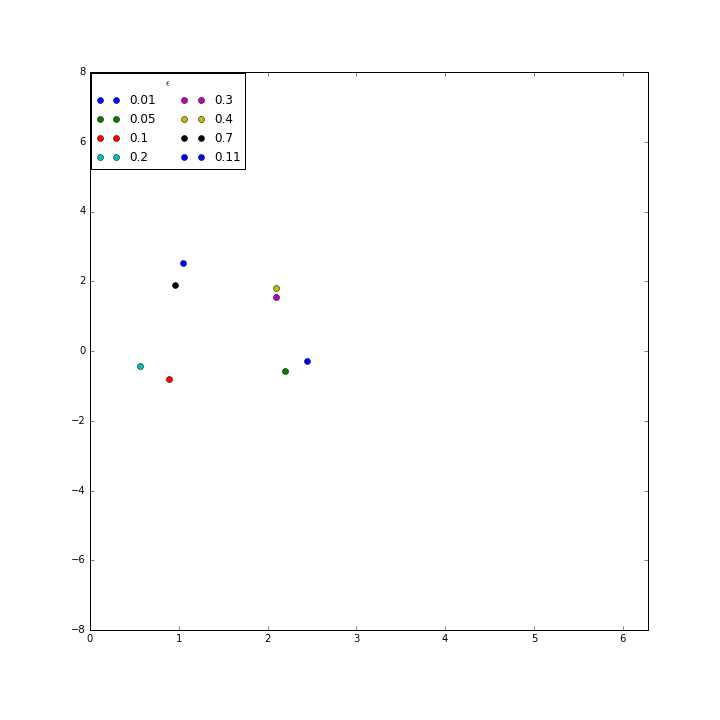

In [24]:
figura = figure(figsize=(10, 10)) #Crea la figura
ejes = axes(xlim=(0,2*pi),ylim=(-8,8))

punto1, = ejes.plot([],[],'o',label='0.01') 
punto2, = ejes.plot([],[],'o',label='0.05')
punto3, = ejes.plot([],[],'o',label='0.1')
punto4, = ejes.plot([],[],'o',label='0.2')
punto5, = ejes.plot([],[],'o',label='0.3')
punto6, = ejes.plot([],[],'o',label='0.4')
punto7, = ejes.plot([],[],'o',label='0.7')
punto8, = ejes.plot([],[],'o',label='0.11')
def init():
    punto1.set_data([],[])
    punto2.set_data([],[])
    punto3.set_data([],[])
    punto4.set_data([],[])
    punto5.set_data([],[])
    punto6.set_data([],[])
    punto7.set_data([],[])
    punto8.set_data([],[])
    return  punto1,punto2,punto3,punto4,punto5,punto6,punto7,punto8,  #Inicializa variables

def el_movimiento1(i):
        theta,p = sol2[0][:,0],sol2[0][:,1]
        punto1.set_data(theta[i],p[i])
        theta,p = sol2[1][:,0],sol2[1][:,1]
        punto2.set_data(theta[i],p[i])
        theta,p = sol2[2][:,0],sol2[2][:,1]
        punto3.set_data(theta[i],p[i])
        theta,p = sol2[3][:,0],sol2[3][:,1]
        punto4.set_data(theta[i],p[i])
        theta,p = sol2[4][:,0],sol2[4][:,1]
        punto5.set_data(theta[i],p[i])
        theta,p = sol2[5][:,0],sol2[5][:,1]
        punto6.set_data(theta[i],p[i])
        theta,p = sol2[6][:,0],sol2[6][:,1]
        punto7.set_data(theta[i],p[i])
        theta,p = sol2[7][:,0],sol2[7][:,1]
        punto8.set_data(theta[i],p[i])
        return punto1,punto2,punto3,punto4,punto5,punto6,punto7,punto8
legend( loc=2,ncol=2, borderaxespad=0.1,title="$\epsilon$")
    
animation.FuncAnimation(figura,el_movimiento1, init_func = init , frames =500,interval=35)


# Simulaciones para el problema 2

Hacemos la simulación para el espacio de configuraciones y el espacio fase del inciso d)

In [27]:
figura = figure(figsize=(10, 10)) #Crea la figura
ejes = axes(xlim=(-.3,.4),ylim=(-8,8))
figura.suptitle('Espacio de configuraciones', fontsize=14, fontweight='bold')
punto1, = ejes.plot([],[],'o',label='0.01')  
punto2, = ejes.plot([],[],'o',label='0.03')
punto3, = ejes.plot([],[],'o',label='0.1')
punto4, = ejes.plot([],[],'o',label='0.12')
punto5, = ejes.plot([],[],'o',label='0.15')
punto6, = ejes.plot([],[],'o',label='0.166')
def init():
    punto1.set_data([],[])
    punto2.set_data([],[])
    punto3.set_data([],[])
    punto4.set_data([],[])
    punto5.set_data([],[])
    punto6.set_data([],[])
    return  punto1,punto2,punto3,punto4,punto5,punto6,  #Inicializa variables

def el_movimiento2(i):
        theta,p = sol[0][14][:,0],sol[0][14][:,1]
        punto1.set_data(theta[i],p[i])
        theta,p = sol[1][14][:,0],sol[1][14][:,1]
        punto2.set_data(theta[i],p[i])
        theta,p = sol[2][14][:,0],sol[2][14][:,1]
        punto3.set_data(theta[i],p[i])
        theta,p = sol[3][14][:,0],sol[3][14][:,1]
        punto4.set_data(theta[i],p[i])
        theta,p = sol[4][14][:,0],sol[4][14][:,1]
        punto5.set_data(theta[i],p[i])
        theta,p = sol[5][14][:,0],sol[5][14][:,1]
        punto6.set_data(theta[i],p[i])

        return punto1,punto2,punto3,punto4,punto5,punto6
legend( loc=2,ncol=2, borderaxespad=0.1,title="$E$")
    
animation.FuncAnimation(figura,el_movimiento2, init_func = init , frames =200,interval=35)

IndexError: index 14 is out of bounds for axis 0 with size 2

IndexError: index 14 is out of bounds for axis 0 with size 2

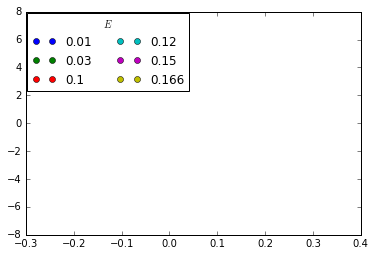

In [28]:
ejes = axes(xlim=(-.3,.4),ylim=(-8,8))
figura.suptitle('Espacio fase en y', fontsize=14, fontweight='bold')
punto1, = ejes.plot([],[],'o',label='0.01')  
punto2, = ejes.plot([],[],'o',label='0.03')
punto3, = ejes.plot([],[],'o',label='0.1')
punto4, = ejes.plot([],[],'o',label='0.12')
punto5, = ejes.plot([],[],'o',label='0.15')
punto6, = ejes.plot([],[],'o',label='0.166')
def init():
    punto1.set_data([],[])
    punto2.set_data([],[])
    punto3.set_data([],[])
    punto4.set_data([],[])
    punto5.set_data([],[])
    punto6.set_data([],[])
    return  punto1,punto2,punto3,punto4,punto5,punto6,  #Inicializa variables

def el_movimiento2(i):
        theta,p = sol[0][14][:,1],sol[0][14][:,3]
        punto1.set_data(theta[i],p[i])
        theta,p = sol[1][14][:,1],sol[1][14][:,3]
        punto2.set_data(theta[i],p[i])
        theta,p = sol[2][14][:,1],sol[2][14][:,3]
        punto3.set_data(theta[i],p[i])
        theta,p = sol[3][14][:,1],sol[3][14][:,3]
        punto4.set_data(theta[i],p[i])
        theta,p = sol[4][14][:,1],sol[4][14][:,3]
        punto5.set_data(theta[i],p[i])
        theta,p = sol[5][14][:,1],sol[5][14][:,3]
        punto6.set_data(theta[i],p[i])

        return punto1,punto2,punto3,punto4,punto5,punto6
legend( loc=2,ncol=2, borderaxespad=0.1,title="$E$")
    
animation.FuncAnimation(figura,el_movimiento2, init_func = init , frames =200,interval=35)